# <b>Mosaic</b><br>


## <b>Setup</b>

### Load modules

/Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/missionbio/mosaic/io.py:47: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm



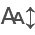

In [1]:
# Import generic libraries
import os
import copy
import random
import multiprocessing
import scanpy as sc
import numpy as nps
import seaborn as sns
import matplotlib.pyplot as plt
import math
import sklearn.metrics
from scipy.stats import ranksums
from scipy.cluster.hierarchy import linkage, leaves_list
from statsmodels.stats.multitest import multipletests

# Import mosaic libraries
import missionbio.mosaic as ms

# Get the number of detectable CPU cores
num_cores = multiprocessing.cpu_count()

# Subtract one from the number of cores
num_cores_to_use = max(1, num_cores - 1)

# Import graph_objects from the plotly package to display figures when saving the notebook as an HTML
import plotly.graph_objects as go

# Import additional packages for specific visuals
import plotly.offline as pyo
pyo.init_notebook_mode()
import numpy as np
from itables import init_notebook_mode, show
from itables.sample_dfs import get_dict_of_test_dfs
import itables.options as opt

# Defining itables options
dict_of_test_dfs = get_dict_of_test_dfs()
init_notebook_mode(all_interactive=True)
opt.lengthMenu = [5, 10, 20, 50, 100, 200, 500]
opt.maxBytes = 0
opt.maxColumns = 0
opt.classes = ["display", "nowrap"]

# Other useful packages for downstream cluster analyses
import pandas as pd

# Note: when exporting the notebook as an HTML, plots that use the "go.Figure(fig)" command are saved

### Define list of packages

In [2]:
pip list

Package                   Version
------------------------- --------------
absl-py                   2.3.1
aiofiles                  24.1.0
aiohappyeyeballs          2.6.1
aiohttp                   3.12.15
aiosignal                 1.4.0
anndata                   0.11.4
annoy                     1.17.3
anyio                     4.10.0
anywidget                 0.9.18
appnope                   0.1.4
argon2-cffi               25.1.0
argon2-cffi-bindings      25.1.0
array-api-compat          1.12.0
arrow                     1.3.0
asttokens                 3.0.0
async-timeout             5.0.1
attrs                     25.3.0
beautifulsoup4            4.13.4
bleach                    6.2.0
Brotli                    1.1.0
cached-property           1.5.2
cellhint                  1.0.0
certifi                   2025.8.3
cffi                      1.17.1
charset-normalizer        3.4.2
chex                      0.1.90
choreographer             1.0.9
chrov                     0.0.3
click       

In [3]:
%env PYTHONHASHSEED=42
random.seed(42)
np.random.seed(42)

env: PYTHONHASHSEED=42


### Define and create folders

In [4]:
# Identifying script folder
cwd = os.getcwd()

# Defining work directory
wd = '/Users/kgurashi/Library/CloudStorage/OneDrive-SharedLibraries-Nexus365/Amy Wood - Shared Tapestri Data/Analysis/02__TP53_MDS_Tapestri'

### Define variables

In [5]:
MBio_batch="MDS010"
Patient_ID="Patient_ID19"

### Load Data

In [6]:
h5_Patient_file_path = wd + f'/Data/TP53_{MBio_batch}/H5_files/Processed/{Patient_ID}/{Patient_ID}_Filtered.h5'
# Load the data
Sample = ms.load(h5_Patient_file_path, filter_variants=False, filter_cells=False) 

            0%: 

### Whitelist

In [7]:
whitelist = ['chr17:7577108:C/T', 'chr20:31022441:A/AG']

# <b> Analysis Sample </b>

## <b>Data Structure</b>

In [8]:
# Summary of DNA assay 
print("\'sample.dna\':", Sample.dna, '\n')
print("\'row_attrs\':", "\n\t", list(Sample.dna.row_attrs.keys()), '\n')
print("\'col_attrs\':", "\n\t", list(Sample.dna.col_attrs.keys()), '\n')
print("\'layers\':", "\n\t", list(Sample.dna.layers.keys()), '\n')
print("\'metadata\':", "\n")
for i in list(Sample.dna.metadata.keys()):
    print("\t", i, ": ", Sample.dna.metadata[i], sep="")

'sample.dna': dna_variants assay with 8 layers, 628 rows and 803 columns 

'row_attrs': 
	 ['barcode', 'filtered', 'label', 'sample_name', 'umap'] 

'col_attrs': 
	 ['ALT', 'Bulk_AF', 'CHROM', 'POS', 'QUAL', 'REF', 'ado_gt_cells', 'ado_rate', 'amplicon', 'filtered', 'id'] 

'layers': 
	 ['AF', 'AF_FILTERED', 'AF_MISSING', 'DP', 'FILTER_MASK', 'GQ', 'NGT', 'NGT_FILTERED'] 

'metadata': 

	sample_name: [['TP53MDS010']]
	ado_rate: 0.19699999999999998
	avg_mapping_error_rate: 0.004640801
	avg_panel_uniformity: 0.8269230769230769
	avg_r1_length: 97
	avg_r2_length: 150
	avg_read_length: 123
	barcode_version: V2
	genome_filename: ucsc_hg19.fa
	genome_version: hg19
	high_quality_variants: 0
	iterations: 10
	min_cell_completeness: 50
	min_dp: 10
	min_gq: 30
	min_mut_prct_cells: 1
	min_prct_cells: 50
	n_R1_reads: 414255365
	n_R2_reads: 412893415
	n_amplicons: 884
	n_bases_r1: 65055843300
	n_bases_r1_q30: 62979764698
	n_bases_r2: 65055843300
	n_bases_r2_q30: 62939621066
	n_cell_barcode_bases: 216

In [9]:
# Summary of Protein assay 
print("\'sample.protein\':", Sample.protein, '\n')
print("\'row_attrs\':", "\n\t", list(Sample.protein.row_attrs.keys()), '\n')
print("\'col_attrs\':", "\n\t", list(Sample.protein.col_attrs.keys()), '\n')
print("\'layers\':", "\n\t", list(Sample.protein.layers.keys()), '\n')
print("\'metadata\':", "\n")
for i in list(Sample.protein.metadata.keys()):
    print("\t", i, ": ", Sample.protein.metadata[i], sep="")

'sample.protein': protein_read_counts assay with 1 layer, 628 rows and 45 columns 

'row_attrs': 
	 ['barcode', 'label', 'sample_name'] 

'col_attrs': 
	 ['antibody_id', 'antibody_sequence', 'id'] 

'layers': 
	 ['read_counts'] 

'metadata': 

	sample_name: [['TP53MDS010']]
	n_antibodies: 45
	n_bases_r1: 52451057700
	n_bases_r1_q30: 50740574990
	n_bases_r2: 52451057700
	n_bases_r2_q30: 51120225123
	n_candidate_barcodes: 477006
	n_cell_barcode_bases: 17767596263
	n_cell_barcode_bases_q30: 17843816173
	n_read_pairs: 349673718
	n_read_pairs_after_candidate_barcode_filtering: 330028935
	n_read_pairs_discarded: 18871222
	n_read_pairs_invalid_ab_barcodes: 15303648
	n_read_pairs_trimmed: 349449497
	n_read_pairs_valid_ab_barcodes: 330578275
	n_read_pairs_valid_cell_barcodes: 345881923
	panel_name: totalseq-d-heme-oncology
	pipeline_version: 4.2.0
	qc_bc_constant1_read_rate: 0.98878
	qc_bc_constant2_read_rate: 0.98038
	qc_gc_content: 0.518133
	qc_max_n: 0.00100836
	qc_q30_rate: 0.971008


## <b> Protein Analysis </b>

### Filtering non-informative proteins

In [10]:
Sample.protein = Sample.protein.drop(['IgG1', 'IgG2a', 'IgG2b'])

### Normalisation

In [11]:
import espressopro as ep
ep.Normalise_protein_data(Sample)
ep.Scale_protein_data(Sample)


Fitting GMMs:   0%|          | 0/628 [00:00<?, ?it/s]

[Normalise_protein_data] Applied MissionBio NSP normalization
[Scale_protein_data] Scaled 'Normalized_reads' -> saved as 'Scaled_reads'


### Dimensionality reduction

In [12]:
Sample.protein.layers

{'read_counts': array([[ 22, 310,  14, ...,  16,   0, 200],
        [ 13,   0,  30, ...,   1,   1,   0],
        [ 43,   0,   0, ...,   1,  12, 187],
        ...,
        [ 32,  26,   1, ..., 553,   1,   0],
        [ 14,  75,  14, ...,   0,  18,   0],
        [ 14,   1,   1, ...,   0,  21,  13]]),
 'Normalized_reads': array([[ 0.35586187,  1.29549895,  0.31322439, ...,  0.3250365 ,
          0.07129867,  1.16087218],
        [ 0.08626657, -0.02158234,  0.45455567, ..., -0.15250498,
         -0.09882312, -0.11538877],
        [ 0.5553256 ,  0.06613865, -0.11856572, ...,  0.25070146,
          0.36899794,  1.31448196],
        ...,
        [ 0.19691439,  0.24293054, -0.13991826, ...,  1.0522622 ,
         -0.10764488, -0.16236987],
        [ 0.13894812,  0.76362012, -0.05407893, ..., -0.07298733,
          0.28499203, -0.43724699],
        [ 0.18068667,  0.01709858,  0.0805637 , ..., -0.21468759,
          0.04926172,  0.11610305]]),
 'Scaled_reads': array([[ 0.5369555 ,  2.49002405,  0

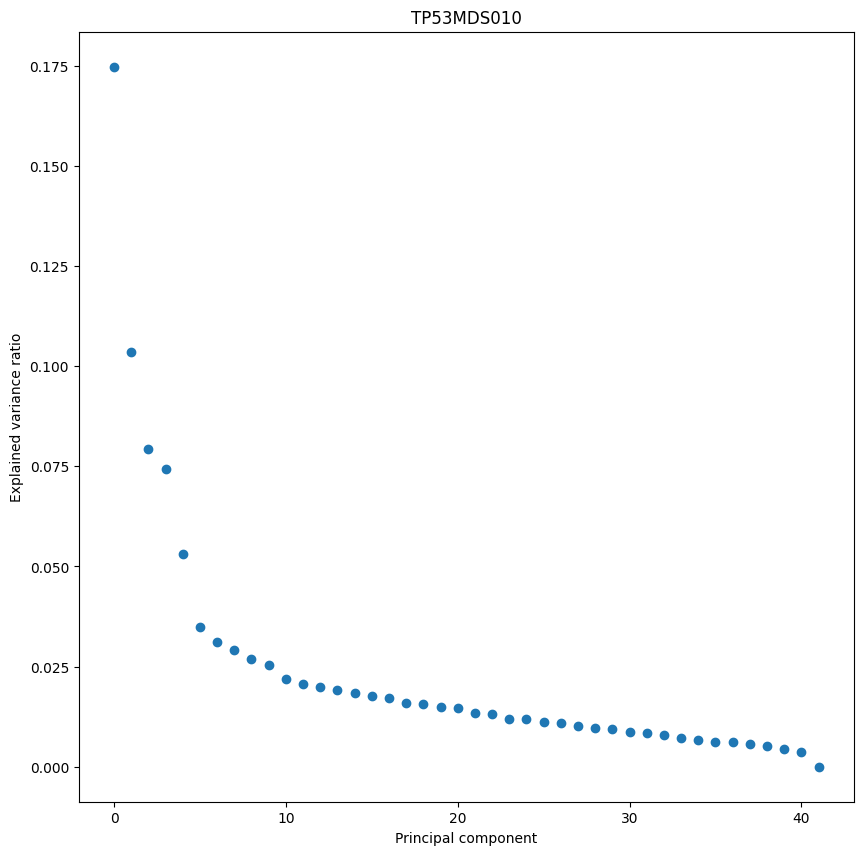

In [13]:
Sample.protein.run_pca(attribute='Scaled_reads', components=45,show_plot=True, random_state=42, svd_solver='randomized')

In [14]:
Sample.protein.run_pca(attribute='Scaled_reads', components=8, show_plot=False, random_state=42, svd_solver='randomized')

In [15]:
Sample.protein.run_umap(attribute='pca', random_state=42, n_neighbors=50, min_dist=0.1, spread=8, n_components=2)

/Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/umap/umap_.py:1394: RuntimeWarning:

divide by zero encountered in power

/Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



### Clustering

In [16]:
Sample.protein.cluster(attribute='umap', method='graph-community', k=4, random_state=42) 

  0%|          | 0/2512 [00:00<?, ?it/s]

Number of clusters found: 45.
Modularity: 0.958


In [17]:
# Examples
Sample = ep.generate_predictions(
    obj=Sample,
    use_atlases="Luecken",          # or ["Triana"]
    add_consensus=True,
    add_unweighted=True,
    # apply_exclusions left as None so it's disabled automatically for single-atlas
)

# Sanity check: these should report 1
Sample.protein.row_attrs["Averaged.Simplified.NK.n_atlases"]
Sample.protein.row_attrs["Averaged.Simplified.NK.agreement"]

Sample = ep.annotate_data(obj=Sample)


[generate_predictions] Using default models path: /Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/espressopro/data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906
[generate_predictions] Using default data path: /Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/espressopro/data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906
[generate_predictions] Ensuring models are available...
[generate_predictions] Restricting to atlases: ['Luecken']
[generate_predictions] query_df shape: 628 cells x 42 features
[generate_predictions] first 12 columns: ['CD10', 'CD117', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD138', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19']
                        CD10     CD117     CD11b     CD11c     CD123      CD13     CD138      CD14     CD141      CD16     CD163      CD19
Normalized_reads                                                                                                                          
AACAACCTATCGCGTCAT  0.3

/Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning:

Transforming to str index.

/Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/espressopro/annotation.py:194: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/espressopro/annotation.py:194: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/espressopro/an

In [18]:
n_fix, _, Sample = ep.refine_labels_by_centroid_knn(
    Sample,
    label_col="Simplified.Celltype",
    out_col="Simplified.Celltype.Refined"
)

n_fix, _, Sample = ep.refine_labels_by_centroid_knn(
    Sample,
    label_col="Detailed.Celltype",
    out_col="Detailed.Celltype.Refined"
)


Sample = ep.mark_small_clusters(Sample, "Simplified.Celltype.Refined", min_count=3)
Sample = ep.mark_small_clusters(Sample, "Detailed.Celltype.Refined", min_count=3)

In [19]:
Sample.protein.row_attrs.keys()

dict_keys(['barcode', 'label', 'sample_name', 'pca', 'umap', 'Luecken.Broad.Immature.predscore', 'Luecken.Broad.Mature.predscore', 'Luecken.Broad.pred', 'Luecken.Broad.conf', 'Luecken.Detailed.B_Memory.predscore', 'Luecken.Detailed.B_Naive.predscore', 'Luecken.Detailed.CD14_Mono.predscore', 'Luecken.Detailed.CD16_Mono.predscore', 'Luecken.Detailed.CD4_CTL.predscore', 'Luecken.Detailed.CD4_T_Memory.predscore', 'Luecken.Detailed.CD4_T_Naive.predscore', 'Luecken.Detailed.CD8_T_Memory.predscore', 'Luecken.Detailed.CD8_T_Naive.predscore', 'Luecken.Detailed.ErP.predscore', 'Luecken.Detailed.Erythroblast.predscore', 'Luecken.Detailed.HSC_MPP.predscore', 'Luecken.Detailed.ILC.predscore', 'Luecken.Detailed.Immature_B.predscore', 'Luecken.Detailed.MAIT.predscore', 'Luecken.Detailed.Myeloid_progenitor.predscore', 'Luecken.Detailed.NK_CD56_bright.predscore', 'Luecken.Detailed.NK_CD56_dim.predscore', 'Luecken.Detailed.Plasma.predscore', 'Luecken.Detailed.Platelet.predscore', 'Luecken.Detailed.Pre-B

In [20]:
fig = Sample.protein.scatterplot(attribute='umap',colorby='Detailed.Celltype.Refined')
go.Figure(fig)

In [21]:
fig = Sample.protein.scatterplot(attribute='umap',colorby='label')
go.Figure(fig)

In [22]:
Sample = ep.generate_predictions(obj=Sample)

[generate_predictions] Using default models path: /Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/espressopro/data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906
[generate_predictions] Using default data path: /Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/espressopro/data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906
[generate_predictions] Ensuring models are available...
[generate_predictions] Using all atlases: Hao, Triana, Zhang, Luecken
[generate_predictions] query_df shape: 628 cells x 42 features
[generate_predictions] first 12 columns: ['CD10', 'CD117', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD138', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19']
                        CD10     CD117     CD11b     CD11c     CD123      CD13     CD138      CD14     CD141      CD16     CD163      CD19
Normalized_reads                                                                                                                          
AACAACCTATCG

In [23]:
Sample = ep.annotate_data(obj=Sample)

[annotate_data] Found existing prediction tracks; skipping generate_predictions.


/Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning:

Transforming to str index.

/Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/espressopro/annotation.py:194: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/espressopro/annotation.py:194: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/Users/kgurashi/anaconda3/envs/mosaic_2/lib/python3.10/site-packages/espressopro/an

In [24]:
n_fix, _, Sample = ep.refine_labels_by_centroid_knn(
    Sample,
    label_col="Simplified.Celltype",
    out_col="Simplified.Celltype.Refined"
)

n_fix, _, Sample = ep.refine_labels_by_centroid_knn(
    Sample,
    label_col="Detailed.Celltype",
    out_col="Detailed.Celltype.Refined"
)


Sample = ep.mark_small_clusters(Sample, "Simplified.Celltype.Refined", min_count=3)
Sample = ep.mark_small_clusters(Sample, "Detailed.Celltype.Refined", min_count=3)

In [25]:
fig = Sample.protein.scatterplot(attribute='umap',colorby='Broad.Celltype')
go.Figure(fig)

In [26]:
fig = Sample.protein.scatterplot(attribute='umap',colorby='Simplified.Celltype.Refined')
go.Figure(fig)

In [27]:
Sample = ep.add_mast_annotation(Sample, field_out="Simplified.Celltype.Refined")
fig = Sample.protein.scatterplot(attribute='umap',colorby='Simplified.Celltype.Refined')
go.Figure(fig)

[Mast] threshold 1.236 → 7 cells


In [28]:
fig = Sample.protein.scatterplot(attribute='umap',colorby='Detailed.Celltype.Refined')
go.Figure(fig)

### Visualisation

In [29]:
fig = Sample.protein.heatmap(attribute='Scaled_reads', splitby='Detailed.Celltype.Refined')
go.Figure(fig)

In [30]:
ep.suggest_cluster_celltype_identity(
    sample=Sample,
    annotation="Simplified.Celltype.Refined")

Sample = ep.suggest_cluster_celltype_identity(
    sample=Sample,
    annotation="Detailed.Celltype.Refined", rewrite=True)

In [31]:
fig = Sample.protein.scatterplot(attribute='umap',colorby='label')
go.Figure(fig)

In [32]:
fig = Sample.protein.scatterplot(attribute='umap',colorby='Luecken.Detailed.Treg.predscore')
go.Figure(fig)

In [33]:
fig = Sample.protein.scatterplot(attribute='umap',colorby='Zhang.Simplified.B.predscore')
go.Figure(fig)

In [34]:
fig = Sample.protein.scatterplot(attribute='umap',colorby='Hao.Simplified.Erythroid.predscore')
go.Figure(fig)

In [35]:
fig = Sample.protein.scatterplot(attribute='umap',colorby='Averaged.Detailed.HSC_MPP.predscore')
go.Figure(fig)

In [36]:
fig = Sample.protein.scatterplot(attribute='umap',colorby='Detailed.Celltype.Refined')
go.Figure(fig)

In [37]:
fig = Sample.protein.scatterplot(attribute='umap',colorby='annotated_clusters')
go.Figure(fig)

In [38]:
mixed_df = ep.score_mixed_clusters(
    Sample,
    clusters=Sample.protein.get_labels(),   # or the name of a row_attrs label field
    labels="Detailed.Celltype.Refined"
)
mixed_df

Loading ITables v2.4.4 from the init_notebook_mode cell... (need help?)


In [39]:
fig = Sample.protein.heatmap(attribute='Normalized_reads', splitby='Detailed.Celltype')
go.Figure(fig)

In [40]:
fig = Sample.protein.scatterplot(attribute='umap',
                           colorby='Scaled_reads',
                           features=Sample.protein.ids())
go.Figure(fig)

In [41]:
Sample.protein.row_attrs['label'] = Sample.protein.row_attrs['annotated_clusters']

In [42]:
Sample.protein.signaturemap('Normalized_reads',
                           splitby='Detailed.Celltype.Refined')

### Cluster relabelling

In [ ]:
fig = Sample.protein.heatmap(attribute='Normalized_reads')
fig.write_image(f"{wd}/Results/TP53_{MBio_batch}/{Patient_ID}/PRO_analysis/Draft_annotation_heatmap.png")
go.Figure(fig)

In [ ]:
Sample.protein.signature('Normalized_reads', 'median')

In [ ]:
Sample.protein.signaturemap('Normalized_reads')

In [ ]:
fig = Sample.protein.scatterplot(attribute='umap',colorby='label')
fig.write_image(f"{wd}/Results/TP53_{MBio_batch}/{Patient_ID}/PRO_analysis/Draft_annotation_umap.png")
go.Figure(fig)

In [ ]:
Sample.dna.row_attrs['umap'] = Sample.protein.row_attrs['umap']
# Re-plot UMAP projection w/ alternative clustering results
fig = Sample.dna.scatterplot('umap', colorby='NGT', features=whitelist)
fig.write_image(f"{wd}/Results/TP53_{MBio_batch}/{Patient_ID}/PRO_analysis/Known_variants_projection_on_draft_annotation_umap.png")
go.Figure(fig)

## Het germline variants identification

In [ ]:
number_of_variants = len(Sample.dna.col_attrs['id'])

subsets = []
Annotation_filtered_detected_variants = []

split_samples = [Sample.dna[:, i:i+1000] for i in range(0, number_of_variants, 1000)]

counter = 0

for i, subset in enumerate(split_samples):
    subsets.append(copy.copy(Sample))
    subsets[counter].dna = subset
    Annotation_filtered_detected_variants.append(subsets[counter].dna.get_annotations())
    counter += 1
    # Save or process new_sample as needed

# Assuming Annotation_filtered_detected_variants is a list of data frames
merged_annotation_filtered_detected_variants = pd.concat(Annotation_filtered_detected_variants, axis=0)

for col, content in merged_annotation_filtered_detected_variants.items():
    Sample.dna.add_col_attr(col, content.values)

In [ ]:
import pandas as pd
import numpy as np
import copy

# Assuming Sample.protein and Sample.dna are already defined

# Process protein assay
for assay in [Sample.protein]:
    df_protein = assay.get_attribute('Normalized_reads', constraint='row+col')
    cols = list(df_protein.columns.values)
    df_protein.loc[:, 'label'] = assay.get_labels()
    df_protein = df_protein.loc[:, ['label'] + cols]

# Process DNA assay for AF
for assay in [Sample.dna]:
    df_dna = assay.get_attribute('AF', constraint='row+col')
    cols = list(df_dna.columns.values)
    df_dna.loc[:, 'label'] = Sample.protein.get_labels()
    df_dna = df_dna.loc[:, ['label'] + cols]

# Process DNA assay for NGT_FILTERED
for assay in [Sample.dna]:
    df_ngt = assay.get_attribute('NGT_FILTERED', constraint='row+col')
    cols = list(df_ngt.columns.values)
    df_ngt.loc[:, 'label'] = Sample.protein.get_labels()
    df_ngt = df_ngt.loc[:, ['label'] + cols]

# Ensure the 'label' column in df_dna matches df_protein
df_dna['label'] = df_protein['label'].astype(str)
df_ngt['label'] = df_protein['label'].astype(str)

# Filter the DataFrame to keep only rows where label is 'CD8T' or 'CD4T'
df_dna_filtered = df_dna[df_dna['label'].isin(['CD8T', 'CD4T'])]
df_ngt_filtered = df_ngt[df_ngt['label'].isin(['CD8T', 'CD4T'])]

# Drop the 'label' column from the filtered DataFrame
df_dna_filtered = df_dna_filtered.drop('label', axis=1)
df_ngt_filtered = df_ngt_filtered.drop('label', axis=1)

# Create a copy of Sample and subset it based on the filtered indices
Sample_T_subset = copy.copy(Sample)
Sample_T_subset = Sample_T_subset[np.array(df_dna_filtered.index)]

# Set values in df_dna to NaN where corresponding values in df_ngt are 3
df_dna_filtered[df_ngt_filtered == 3] = np.nan

# Display the filtered DataFrame
print(df_dna_filtered)

In [ ]:
df_ngt = Sample_T_subset.dna.get_attribute('NGT_FILTERED', constraint='row+col')
cols = list(df_ngt.columns.values)
df_ngt = df_ngt.loc[:, cols]

# Assuming df_ngt is your DataFrame
result = {}

for column in df_ngt.columns:
    zero_three_count = ((df_ngt[column] == 0) | (df_ngt[column] == 3)).sum()
    total_count = len(df_ngt[column])
    if zero_three_count / total_count < 0.5:
        result[column] = df_ngt.index[(df_ngt[column] != 0) & (df_ngt[column] != 3)].tolist()

# Columns where less than 50% of cells are equal to 1 or 3
filtered_columns = list(result.keys())

# Keep only the filtered columns in Sample_T_subset.dna_subset
Sample_T_subset.dna_subset = Sample_T_subset.dna[:, filtered_columns]

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Extract the data
data = np.array(Sample_T_subset.dna_subset.layers['AF'].mean(axis=0)).reshape(-1, 1)

# Plot the histogram
sns.set_style('whitegrid')
plt.hist(data.flatten(), bins=30, alpha=0.6, color='g')

# Set y-axis to log scale
plt.yscale('log', base=10)

plt.title('Histogram with Automatic Thresholds (Log2 Frequency)')
plt.xlabel('AF')
plt.ylabel('Frequency (Log2)')

# Save the plot
output_path = wd + f'/Results/TP53_{MBio_batch}/{Patient_ID}/DNA_analysis/Variants/Pseudobulk_VAFs_T_cells_variants.png'

plt.savefig(output_path)

# Show the plot
plt.show()

In [ ]:
germline_variants = sorted(Sample_T_subset.dna_subset.col_attrs['id'])

# Define a function to extract the chromosome number
def extract_chr_num(variant):
    parts = variant.split(':')
    chr_part = parts[0]
    if chr_part == 'chrX':
        return 23  # Assign a high number to 'chrX' to sort it last
    else:
        return int(chr_part[3:])  # Extract the number after 'chr'

# Sort the combined list using the custom function
germline_variants = sorted(germline_variants, key=extract_chr_num)

# Print the combined variables
print(germline_variants)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from chrov.viz.figure import plot_with_chroms

# Load cytobands data
cytobands = pd.read_table(f'{wd}' + '/Resources/cytobands.tsv', index_col=[0])
cytobands.head(1)

# Create the DataFrame from the col_attrs
col_attrs_df = pd.DataFrame({
    'variant': Sample_T_subset.dna_subset.col_attrs['id'],
    'gene symbol': Sample_T_subset.dna_subset.col_attrs['Gene'],
    'chromosome': Sample_T_subset.dna_subset.col_attrs['CHROM'],
    'position': Sample_T_subset.dna_subset.col_attrs['POS'],
    'VAF': Sample_T_subset.dna_subset.layers['AF'].mean(axis=0)
})

col_attrs_df['Annotation'] = col_attrs_df['gene symbol'] + ' (' + col_attrs_df['variant'] + ')'

plot_with_chroms(
    data=col_attrs_df.copy(),
    cytobands=cytobands,
    kind='stem',
    colx='position',
    coly='VAF',
    col_label='Annotation',
    xkind='loci',
    va='bottom',
    chrom_y=0,
    off=2.25,
    offy=-1.25,
    figsize=[60, 4],
    arc=False,
    fig=None,
    kws_seaborn={},
    kws_annot_chroms={},
    kws_annot_labels={},
)

plt.savefig(wd + f'/Results/TP53_{MBio_batch}/{Patient_ID}/DNA_analysis/Variants/Germline_variants_distribution.png', bbox_inches='tight')

In [ ]:
import matplotlib.pyplot as plt

# Count rows per chromosome
chromosome_counts = col_attrs_df.groupby('chromosome').size()

# Iterate over chromosomes and arms
for chr in set(col_attrs_df['chromosome']):
    if chromosome_counts[chr] < 2:
        continue  # Skip chromosomes with less than 2 rows
    plot_with_chroms(
        data=col_attrs_df[col_attrs_df['chromosome'] == chr].copy(),
        cytobands=cytobands.query(f"`chromosome` == '{chr}'"),
        kind='stem',
        colx='position',
        coly='VAF', 
        col_label='Annotation',
        xkind='loci',
        va='bottom',
        chrom_y=0,
        off=0.15,
        offy=0.55,
        figsize=[6, 2],
        arc=False,
        fig=None,
        kws_seaborn=dict(),  # Set y-axis range from 0 to 1
        kws_annot_chroms={},
        kws_annot_labels={},
    )

    plt.savefig(wd + f'/Results/TP53_{MBio_batch}/{Patient_ID}/DNA_analysis/Variants/Germline_variants_distribution_chr{chr}.png', bbox_inches='tight')

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Extract numeric part of chromosome and convert to integers
col_attrs_df['chromosome_number'] = col_attrs_df['chromosome'].str.extract('(\d+)')
col_attrs_df['chromosome_number'] = col_attrs_df['chromosome_number'].fillna(0).astype(int)

# Replace 'X' with max chromosome number + 1
max_chromosome_number = col_attrs_df['chromosome_number'].max()
col_attrs_df.loc[col_attrs_df['chromosome'] == 'X', 'chromosome_number'] = max_chromosome_number + 1

print(col_attrs_df)

# Step 3: Order by 'chromosome_number' and 'position'
col_attrs_df = col_attrs_df.sort_values(by=['chromosome_number', 'position'])

# Step 4: Plot scatter plot with VAF as y and position as x, splitting by chromosome_number
g = sns.FacetGrid(col_attrs_df, col="chromosome", col_wrap=4, sharey=False)
g.map(sns.scatterplot, "position", "VAF", alpha=0.6, color='g')

g.set(ylim=(0, 100))
g.fig.set_figheight(10)
g.fig.set_figwidth(10)

output_path = wd + f'/Results/TP53_{MBio_batch}/{Patient_ID}/DNA_analysis/Variants/Pseudobulk_VAFs_T_cells_selected_variants_across_chrs.png'
plt.savefig(output_path)

plt.show()

### Projection variants on protein umap

In [ ]:
Sample.dna.row_attrs['umap'] = Sample.protein.row_attrs['umap']

In [ ]:
wt_col = ms.COLORS[17]
hom_col = ms.COLORS[2]
het_col = ms.COLORS[18]
miss_col = ms.COLORS[-1]

sns.palplot([wt_col, het_col, hom_col, miss_col])

In [ ]:
ms.Config.Colorscale.Dna.NGT = [
    (0 / 4, wt_col), (1 / 4, wt_col),
    (1 / 4, het_col), (2 / 4, het_col),
    (2 / 4, hom_col), (3 / 4, hom_col),
    (3 / 4, miss_col), (4 / 4, miss_col)
]

In [ ]:
Sample.dna.scatterplot('umap', colorby='NGT_FILTERED', features=['chr17:7577108:C/T'])

In [ ]:
# index = -1

# for element in germline_variants:
#     index += 1
#     safe_element = element.replace(':', '/')
#     safe_element = safe_element.replace('/', '_')
#     file_path = wd + "/Results/TP53_MDS001/{Patient_ID}/DNA_analysis/Germline_Variants_Distribution_with_zigosity/" + safe_element + "_.png"
    
#     if not os.path.exists(file_path):
#         fig = Sample.dna.scatterplot('umap', colorby='NGT_FILTERED', features=[element])
#         fig.write_image(file_path)

## <b> Differential variants </b>

### Identification of differential variants

In [ ]:
# Re-plot UMAP projection w/ alternative clustering results
fig = Sample.protein.scatterplot(attribute='umap', colorby='label')
go.Figure(fig)

In [ ]:
# Assume arr is your array
pro_anno = Sample.protein.row_attrs['label']

new_pro_anno = pro_anno.copy()

# Reassign 'CD8 T' and 'CD4 T' as 'T', and all the rest as 'Rest'
new_pro_anno = np.where((new_pro_anno == 'CD8T') | (new_pro_anno == 'CD4T'), 'T', 'Rest')

Sample.protein.row_attrs['label'] = new_pro_anno

In [ ]:
# Re-plot UMAP projection w/ alternative clustering results
fig = Sample.protein.scatterplot(attribute='umap', colorby='label')

fig.write_image(wd + f'/Results/TP53_{MBio_batch}/{Patient_ID}/PRO_analysis/Draft_protein_annotation_grouped_T.png')
go.Figure(fig)

In [ ]:
df = Sample.dna.get_attribute('AF', constraint='row+col')
cols = list(df.columns.values)
df.loc[:, 'label'] = Sample.protein.get_labels()
df = df.loc[:, ['label'] + cols]

In [ ]:
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

# Assuming df is your DataFrame
target_col = 'chr17:7577108:C/T'
significance_threshold = 0.05

# Initialize lists to store column names, p-values, and R-squared values
significant_cols = []
p_values = []
r_squared_values = []

In [ ]:
df.drop(columns='label').columns

In [ ]:
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

# Assuming df is your DataFrame
target_col = 'chr17:7577108:C/T'
significance_threshold = 0.05

# Initialize lists to store column names, p-values, and R-squared values
significant_cols = []
p_values = []
r_squared_values = []

# For each column except the target column
for col in df.drop(columns='label').columns:
    if col != target_col:
        # Calculate the Pearson correlation coefficient and p-value
        corr, p = pearsonr(df.drop(columns='label')[target_col], df.drop(columns='label')[col])
        
        # Append the column name, p-value, and R-squared value to the lists
        significant_cols.append(col)
        p_values.append(p)
        r_squared_values.append(corr**2)

# Apply Bonferroni correction
bonferroni_corrected_p = [min(p * len(p_values), 1.0) for p in p_values]

# Apply Benjamini-Hochberg correction
_, bh_corrected_p, _, _ = multipletests(p_values, alpha=significance_threshold, method='fdr_bh')

# Create a DataFrame with the significant columns, their p-values, R-squared values, and corrected p-values
results_correlating_vars = pd.DataFrame({
    'column': significant_cols,
    'p_value': p_values,
    'r_squared': r_squared_values,
    'bonferroni_corrected_p': bonferroni_corrected_p,
    'bh_corrected_p': bh_corrected_p
})

# Filter the results based on the corrected p-values
significant_corr_results = results_correlating_vars[results_correlating_vars['bonferroni_corrected_p'] < significance_threshold]

# Print the results
print(significant_corr_results)

In [ ]:
fig = Sample.dna.heatmap(attribute='AF', override=True, splitby=Sample.protein.get_labels(), features=significant_corr_results['column']) 
go.Figure(fig)

In [ ]:
significant_corr_results# Exclude rows from significant_corr_results where the column is equal to 'chr5:176943905:T/C' or 'chrX:47058653:T/C'
filtered_significant_corr_results = significant_corr_results[~significant_corr_results['column'].isin([whitelist[0], whitelist[1]])]

# Print the filtered results
print(filtered_significant_corr_results)

In [ ]:
# Assume df is your DataFrame
# Get the unique classes in column 0
classes = df.iloc[:, 0].unique()

# Initialize lists to store p-values and LFCs
p_values = []
lfc_values = []

# For each column except the first one
for col in df.columns[1:]:
    # Calculate the mean values for each class
    mean_class_0 = df[df.iloc[:, 0] == classes[0]][col].mean()
    mean_class_1 = df[df.iloc[:, 0] == classes[1]][col].mean()
    
    # Compute the log fold change (LFC)
    lfc = np.log2(mean_class_1 / mean_class_0)
    
    # Perform a Wilcoxon rank sum test
    stat, p = ranksums(df[df.iloc[:, 0] == classes[0]][col], df[df.iloc[:, 0] == classes[1]][col])
    
    # Append the p-value and LFC to the lists
    p_values.append(p)
    lfc_values.append(lfc)

# Convert the p-values to log10
log_p_values = -np.log10(p_values)

# Apply Bonferroni correction
bonferroni_corrected_p = [min(p * len(p_values), 1.0) for p in p_values]

# Apply Benjamini-Hochberg correction
_, bh_corrected_p, _, _ = multipletests(p_values, alpha=0.05, method='fdr_bh')

# Create a DataFrame with the column names, log10 p-values, LFCs, and corrected p-values
results = pd.DataFrame({
    'column': df.columns[1:],
    'log_p_value': log_p_values,
    'lfc_values': lfc_values,
    'bonferroni_corrected_p': bonferroni_corrected_p,
    'bh_corrected_p': bh_corrected_p
})

# Sort the DataFrame by the log10 p-values in descending order
results = results.sort_values('log_p_value', ascending=False)

# Filter the results based on the corrected p-values
significant_wilcox_results = results[results['log_p_value'] > 1.30103]

# Print the results
significant_wilcox_results

In [ ]:
# Assuming filtered_significant_corr_results and significant_wilcox_results are DataFrames
# Concatenate the 'column' values from both DataFrames, make them unique, and convert to a list
concatenated_unique = pd.concat([filtered_significant_corr_results['column'], significant_wilcox_results['column']]).unique().tolist()

# Assuming whitelist is a list of columns to filter
# Combine the unique values with whitelist, make the combined list unique, and sort it
differential_variants = sorted(set(concatenated_unique + whitelist))

# Sort the combined list using the custom function
differential_variants = np.array(sorted(differential_variants, key=extract_chr_num))

# Print the combined variables
print(differential_variants)

In [ ]:
# Assuming df is your DataFrame and combined_useful_variants_sorted is a list of columns to filter

df_filtered = df[differential_variants]
cols = list(df_filtered.columns.values)
df_filtered.loc[:, 'label'] = Sample.protein.get_labels()
df_filtered = df_filtered.loc[:, ['label'] + cols]

# Extract chromosome and position from column names
def extract_chr(col):
    parts = col.split(':')
    chr_num = parts[0]  # Extract the chromosome part
    return chr_num

# Apply the extraction function to each column except 'label'
chr_list = df_filtered.columns[1:].map(extract_chr)

# Get the unique labels
unique_labels = df_filtered['label'].unique()

# Create subplots
fig, axes = plt.subplots(len(unique_labels), 1, figsize=(16, 6 * len(unique_labels)), sharex=True)

# Create a heatmap for each unique label
for i, (ax, label) in enumerate(zip(axes, unique_labels)):
    # Filter the DataFrame for the current label
    df_label = df_filtered[df_filtered['label'] == label]
    
    # Drop the 'label' column
    df_label = df_label.drop(columns='label')
    
    # Perform hierarchical clustering
    linkage_matrix = linkage(df_label, method='average')
    ordered_indices = leaves_list(linkage_matrix)
    df_label = df_label.iloc[ordered_indices, :]

    sns.set(font_scale=0.1)
    
    # Create the heatmap
    sns.heatmap(df_label, cmap='mako', cbar=True, ax=ax)
    

    # Add vertical lines to separate variants starting with different chromosomes
    prev_chr = None
    for j, chr_num in enumerate(chr_list):
        if chr_num != prev_chr:
            ax.axvline(x=j, color='white', linestyle='--', linewidth=3)
            ax.text(j, ax.get_ylim()[1] - 4, chr_num, ha='center', va='bottom', color='black', fontsize=12, fontweight='bold', rotation=90)
            prev_chr = chr_num

    ax.set_yticklabels([])
    ax.tick_params(axis='x', labelsize=10, labelrotation=90)
    
    # Add title and labels
    ax.set_title(f'Clustered Heatmap of Differential Variables for cells: {label}')
    ax.set_xlabel('Variables')

# Increase the font size of the color bar
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=10)  # Set the desired font size

# Adjust layout
plt.tight_layout()

# Save the figure
#output_path = wd + "/Results/TP53_MDS001/{Patient_ID}/DNA_analysis/Variants/Differential_significant_variants.png"
#fig.savefig(output_path)

# Show the heatmap
plt.show()

In [ ]:
# Assuming germline_variants and differential_vars are lists or numpy arrays
combined_useful_variants = sorted(np.concatenate((germline_variants, differential_variants)))

# Define a function to extract the chromosome number
def extract_chr_num(variant):
    parts = variant.split(':')
    chr_part = parts[0]
    if chr_part == 'chrX':
        return 23  # Assign a high number to 'chrX' to sort it last
    else:
        return int(chr_part[3:])  # Extract the number after 'chr'

# Sort the combined list using the custom function
combined_useful_variants_sorted = sorted(combined_useful_variants, key=extract_chr_num)

# Print the combined variables
print(combined_useful_variants_sorted)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, leaves_list
from adjustText import adjust_text

# Assuming df is your DataFrame and combined_useful_variants_sorted is a list of columns to filter

df_filtered = df[combined_useful_variants_sorted]
cols = list(df_filtered.columns.values)
df_filtered.loc[:, 'label'] = Sample.protein.get_labels()
df_filtered = df_filtered.loc[:, ['label'] + cols]

# Extract chromosome and position from column names
def extract_chr(col):
    parts = col.split(':')
    chr_num = parts[0]  # Extract the chromosome part
    return chr_num

# Apply the extraction function to each column except 'label'
chr_list = df_filtered.columns[1:].map(extract_chr)

# Get the unique labels
unique_labels = df_filtered['label'].unique()

# Create subplots
fig, axes = plt.subplots(len(unique_labels), 1, figsize=(40, 6 * len(unique_labels)), sharex=True)

# Create a heatmap for each unique label
for i, (ax, label) in enumerate(zip(axes, unique_labels)):
    # Filter the DataFrame for the current label
    df_label = df_filtered[df_filtered['label'] == label]
    
    # Drop the 'label' column
    df_label = df_label.drop(columns='label')
    
    # Perform hierarchical clustering
    linkage_matrix = linkage(df_label, method='average')
    ordered_indices = leaves_list(linkage_matrix)
    df_label = df_label.iloc[ordered_indices, :]
    
    # Create the heatmap
    sns.heatmap(df_label, cmap='mako', cbar=True, ax=ax)

    # Add vertical lines to separate variants starting with different chromosomes
    prev_chr = None
    texts = []
    for j, chr_num in enumerate(chr_list):
        if chr_num != prev_chr:
            ax.axvline(x=j, color='white', linestyle='--', linewidth=3)
            text = ax.text(j, ax.get_ylim()[1] - 4, chr_num, ha='center', va='bottom', color='black', fontsize=12, fontweight='bold', rotation=90)
            texts.append(text)
            prev_chr = chr_num

    ax.set_yticklabels([])
    ax.tick_params(axis='x', labelsize=10, labelrotation=90)
    
    # Add title and labels
    ax.set_title(f'Clustered Heatmap of Differential Variables for cells: {label}')
    ax.set_xlabel('Variables')

    # Increase the font size of the color bar
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=10)  # Set the desired font size

# Adjust layout
plt.tight_layout()

# Save the figure
#output_path = wd + "/Results/TP53_MDS001/{Patient_ID}/DNA_analysis/Variants/Differential_and_het_germline_variants.png"
#fig.savefig(output_path)

# Show the heatmap
plt.show()

In [ ]:
# index = -1

# for element in combined_useful_variants_sorted:
#     index += 1
#     safe_element = element.replace(':', '/')
#     safe_element = safe_element.replace('/', '_')
#     file_path = wd + "/Results/TP53_MDS001/{Patient_ID}/DNA_analysis/Relevant_Variants_Distribution_with_zigosity/" + safe_element + "_.png"
    
#     if not os.path.exists(file_path):
#         fig = Sample.dna.scatterplot('umap', colorby='NGT_FILTERED', features=[element])
#         fig.write_image(file_path)

In [ ]:
Sample.dna = Sample.dna[:, combined_useful_variants_sorted]

## <b> Clonal annotation </b>

In [ ]:
Sample.dna.row_attrs["label"] = ['Undetermined'] * len(Sample.dna.row_attrs["barcode"])

### Clones identification

In [ ]:
df = Sample.dna.get_attribute('AF', constraint='row+col')
cols = list(df.columns.values)

In [ ]:
df

In [ ]:
whitelist = ['chr17:7577108:C/T', 'chr20:31022441:A/AG']

In [ ]:
# Update the label for specific barcodes
for i, barcode in enumerate(Sample.dna.row_attrs['barcode']):
    if barcode in df[(df['chr17:7577108:C/T'] > 90)].index:
        Sample.dna.row_attrs['label'][i] = 'TP53 C277Y Het'

In [ ]:
# Update the label for specific barcodes
for i, barcode in enumerate(Sample.dna.row_attrs['barcode']):
    if barcode in df[(df['chr17:7577108:C/T'] > 10) & (df['chr17:7577108:C/T'] <= 90)].index:
        Sample.dna.row_attrs['label'][i] = 'TP53 C277Y Het'

In [ ]:
# Update the label for specific barcodes
for i, barcode in enumerate(Sample.dna.row_attrs['barcode']):
    if barcode in df[(df['chr20:31022441:A/AG'] > 90)].index:
        if Sample.dna.row_attrs['label'][i] == 'Undetermined':
            Sample.dna.row_attrs['label'][i] = 'ASXL1 G646fs Hom'
        else:
            Sample.dna.row_attrs['label'][i] = str(Sample.dna.row_attrs['label'][i]) + ' ASXL1 G646fs Hom'

In [ ]:
# Update the label for specific barcodes
for i, barcode in enumerate(Sample.dna.row_attrs['barcode']):
    if barcode in df[(df['chr20:31022441:A/AG'] > 10) & (df['chr20:31022441:A/AG'] <= 90)].index:
        if Sample.dna.row_attrs['label'][i] == 'Undetermined':
            Sample.dna.row_attrs['label'][i] = 'ASXL1 G646fs Het'
        else:
            Sample.dna.row_attrs['label'][i] = str(Sample.dna.row_attrs['label'][i]) + ' ASXL1 G646fs Het'

In [ ]:
# Filter elements containing 'chr17:75'
chr17_75_variants = [variant for variant in combined_useful_variants_sorted if 'chr17:75' in variant]

# Convert the filtered list to a numpy array
chr17_75_variants = np.array(list(set(chr17_75_variants + whitelist)))

# Print the filtered variants
print(chr17_75_variants)

In [ ]:
fig = Sample.dna.heatmap(attribute='AF', override=True, splitby=Sample.dna.row_attrs['label'], 
                         features=chr17_75_variants) 

# Create a figure
fig = go.Figure(fig)

# Set the size of the figure
fig.update_layout(
    autosize=False,
    width=1200,
    height=1600,
)

# Display the figure
fig.show()

In [ ]:
# Re-plot UMAP projection w/ alternative clustering results
fig = Sample.protein.scatterplot(attribute='umap', colorby='label')
go.Figure(fig)

In [ ]:
Sample.protein.row_attrs['label'] = pro_anno

# Re-plot UMAP projection w/ alternative clustering results
fig = Sample.protein.scatterplot(attribute='umap', colorby='label')
go.Figure(fig)

In [ ]:
# Re-plot UMAP projection w/ alternative clustering results
fig = Sample.protein.scatterplot(attribute='umap', colorby=Sample.dna.get_labels())
go.Figure(fig)

### General clustering

In [ ]:
indices = [i for i, x in enumerate(Sample.dna.row_attrs["label"]) if x == 'Undetermined']
# Update the label for specific barcodes
for i, barcode in enumerate(Sample.dna.row_attrs['barcode']):
    if i in indices:
        Sample.dna.row_attrs['label'][i] = 'WT'

In [ ]:
fig = Sample.dna.heatmap(attribute='AF', override=True, 
                         splitby=Sample.dna.row_attrs['label'], features=chr17_75_variants) 

# Create a figure
fig = go.Figure(fig)

# Set the size of the figure
fig.update_layout(
    autosize=False,
    width=1200,
    height=1600,
)

#fig.write_image(wd + "/Results/TP53_MDS001/{Patient_ID}/DNA_analysis/Clonotypes/Final_clonal_annotation.png")

# Display the figure
fig.show()

### Visualisation final results

## <b> Plotting single cell VAFs </b>

In [ ]:
df = pd.DataFrame(index=Sample.dna.get_variant_bulk_metrics(variants=None)['VAF by cell count'].index)
df

for clone in list(set(Sample.dna.row_attrs['label'])):
    sample_dna_analysis_subset = copy.copy(Sample)
    indices = [i for i, x in enumerate(sample_dna_analysis_subset.dna.row_attrs["label"]) if x == clone]
    subset = sample_dna_analysis_subset.dna[indices, :]
    df[clone] = subset.get_variant_bulk_metrics(variants=None)['VAF by cell count'].values

In [ ]:
list(set(Sample.dna.row_attrs['label']))

In [ ]:
show(df)

In [ ]:
df = df.reindex(columns=['WT', 'TP53 C277Y Het', 'ASXL1 G646fs Het'])

In [ ]:
df = df.loc[whitelist,:]

In [ ]:
def extract_chr(col):
    parts = col.split(':')
    chr_num = parts[0]  # Extract the chromosome part
    return chr_num

# Apply the extraction function to each column except 'label'
chr_list = df.index.map(extract_chr)

# Set the size of the figure
plt.figure(figsize=(6, 3))  # You can adjust the size as needed

sns.set(font_scale=0.1)

# Create the heatmap
ax = sns.heatmap(df.T)

# Add vertical lines to separate variants starting with different chromosomes
prev_chr = None
for j, chr_num in enumerate(chr_list):
    if chr_num != prev_chr:
        ax.axvline(x=j, color='white', linestyle='--', linewidth=2)
        ax.text(j, ax.get_ylim()[1] - 0.2, chr_num, ha='center', va='bottom', color='black', fontsize=8, fontweight='bold', rotation=90)
        prev_chr = chr_num

# Get the x-axis labels
xticklabels = ax.get_xticklabels()
ax.tick_params(axis='x', labelsize=6)
ax.tick_params(axis='y', labelsize=6, labelrotation=0)
for label in ax.get_yticklabels():
    label.set_weight('bold')

# Define the values you want to highlight
values_to_highlight = whitelist  # Replace with your values

# Iterate over the labels and change the color of the ones that match your values
for label in xticklabels:
    if label.get_text() in values_to_highlight:
        label.set_color('red')

# Increase the font size of the color bar
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=10)  # Set the desired font size

plt.savefig(wd + f'/Results/TP53_{MBio_batch}/{Patient_ID}/DNA_analysis/Allele_Frequencies/Clones_AF.png', dpi=300, bbox_inches='tight')

plt.show()

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming Sample is already defined and contains the necessary data
labels = Sample.dna.get_labels()

# Convert labels to a pandas Series
labels_series = pd.Series(labels)

# Count the occurrences of each unique label
label_counts = labels_series.value_counts().reset_index()
label_counts.columns = ['Label', 'Count']

# Define the desired order of x-axis labels
desired_order = ['WT', 'TP53 C277Y Het', 'ASXL1 G646fs Het']

# Reorder label_counts
label_counts['Label'] = pd.Categorical(label_counts['Label'], categories=desired_order, ordered=True)
label_counts = label_counts.sort_values('Label').reset_index(drop=True)

# Set the default font size for the plot
plt.rcParams.update({'font.size': 12})

# Create a horizontal bar plot with seaborn
plt.figure(figsize=(4, 3))
barplot = sns.barplot(y='Label', x='Count', data=label_counts)

# Add text labels to each bar
for index, row in label_counts.iterrows():
    barplot.text(row['Count'], index, row['Count'], color='black', ha="center", va="center")

# Add title and axis labels
plt.title('Counts of Each Unique Label', fontsize=12, fontweight='bold')
plt.xlabel('Counts', fontsize=12, fontweight='bold')
plt.ylabel('', fontsize=12, fontweight='bold')

# Rotate y-axis labels
plt.yticks(fontsize=12, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')

plt.savefig(wd + f'/Results/TP53_{MBio_batch}/{Patient_ID}/DNA_analysis/Allele_Frequencies/Clones_Absolute_Number.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming Sample is already defined and contains the necessary data
labels = Sample.dna.get_labels()

# Convert labels to a pandas Series
labels_series = pd.Series(labels)

# Count the occurrences of each unique label
label_counts = labels_series.value_counts().reset_index()
label_counts.columns = ['Label', 'Count']

# Calculate the percentage for each label
total_count = label_counts['Count'].sum()
label_counts['Percentage'] = (label_counts['Count'] / total_count) * 100

# Define the desired order of x-axis labels
desired_order = ['WT', 'TP53 C277Y Het', 'ASXL1 G646fs Het']

# Reorder label_counts
label_counts['Label'] = pd.Categorical(label_counts['Label'], categories=desired_order, ordered=True)
label_counts = label_counts.sort_values('Label').reset_index(drop=True)

# Set the default font size for the plot
plt.rcParams.update({'font.size': 12})

# Create a horizontal bar plot with seaborn
plt.figure(figsize=(4, 3))
barplot = sns.barplot(y='Label', x='Percentage', data=label_counts)

# Add text labels to each bar
for index, row in label_counts.iterrows():
    barplot.text(row['Percentage'], index, f"{row['Percentage']:.2f}%", color='black', ha="center", va="center")

# Add title and axis labels
plt.title('Percentage of Each Unique Label', fontsize=12, fontweight='bold')
plt.xlabel('Percentage', fontsize=12, fontweight='bold')
plt.ylabel('', fontsize=12, fontweight='bold')

# Rotate y-axis labels
plt.yticks(fontsize=12, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')

#plt.savefig(wd + "/Results/TP53_MDS001/{Patient_ID}/DNA_analysis/Clonotypes/Clones_relative_number.png", dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

In [ ]:
# Assuming df is your DataFrame and combined_useful_variants_sorted is a list of columns to filter

df = Sample.dna.get_attribute('AF', constraint='row+col')
cols = list(df.columns.values)
df.loc[:, 'label'] = Sample.dna.get_labels()
df = df.loc[:, ['label'] + cols]

# Extract chromosome and position from column names
def extract_chr(col):
    parts = col.split(':')
    chr_num = parts[0]  # Extract the chromosome part
    return chr_num

# Apply the extraction function to each column except 'label'
chr_list = df.columns[1:].map(extract_chr)

# Get the unique labels
unique_labels = ['WT', 'TP53 C277Y Het', 'ASXL1 G646fs Het']

# Create subplots
fig, axes = plt.subplots(len(unique_labels), 1, figsize=(40, 6 * len(unique_labels)), sharex=True)

# Create a heatmap for each unique label
for i, (ax, label) in enumerate(zip(axes, unique_labels)):
    # Filter the DataFrame for the current label
    df_label = df[df['label'] == label]
    
    # Drop the 'label' column
    df_label = df_label.drop(columns='label')
    
    # Perform hierarchical clustering
    linkage_matrix = linkage(df_label, method='average')
    ordered_indices = leaves_list(linkage_matrix)
    df_label = df_label.iloc[ordered_indices, :]
    
    # Create the heatmap
    sns.heatmap(df_label, cbar=True, ax=ax)

    # Add vertical lines to separate variants starting with different chromosomes
    prev_chr = None
    texts = []
    for j, chr_num in enumerate(chr_list):
        if chr_num != prev_chr:
            ax.axvline(x=j, color='white', linestyle='--', linewidth=5)
            text = ax.text(j, ax.get_ylim()[1] - 2, chr_num, ha='center', va='bottom', color='black', fontsize=12, fontweight='bold', rotation=90)
            texts.append(text)
            prev_chr = chr_num

    ax.set_yticklabels([])
    ax.tick_params(axis='x', labelsize=10, labelrotation=90)

    # Add title and labels
    ax.set_title(f'{label}', fontsize=18, fontweight='bold')
    ax.set_xlabel('Variables')
    
    # Increase the font size of the color bar
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=10)  # Set the desired font size

# Adjust layout
plt.tight_layout()

# Save the figure
#output_path = wd + "/Results/TP53_MDS001/{Patient_ID}/DNA_analysis/Clonotypes/Single_cell_clones_AF.png"
#fig.savefig(output_path)

# Show the heatmap
plt.show()

## <b> Exporting filtered matrices </b>

In [ ]:
## set directory that does NOT exist
folder_to_save = wd + f'/Data/TP53_{MBio_batch}/Count_matrices/Processed/{Patient_ID}'
      
if not os.path.exists(folder_to_save):
    os.makedirs(folder_to_save)    

for assay in [Sample.protein]:
    if assay is not None:
        if not os.path.exists(f'{folder_to_save}/{assay.name}'):
            os.makedirs(f'{folder_to_save}/{assay.name}')
        if not os.path.exists(f'{folder_to_save}/{assay.name}/Filtered'):
            os.makedirs(f'{folder_to_save}/{assay.name}/Filtered')

        for layer in assay.layers.keys():
            df = assay.get_attribute(layer, constraint='row+col')
            cols = list(df.columns.values)
            df.loc[:, 'label'] = assay.get_labels()
            df = df.loc[:, ['label'] + cols]
            df.to_csv(f'{folder_to_save}/{assay.name}/Filtered/{layer}.csv')

In [ ]:
## set directory that does NOT exist
folder_to_save = wd + f'/Data/TP53_{MBio_batch}/Count_matrices/Processed/{Patient_ID}'
      
if not os.path.exists(folder_to_save):
    os.makedirs(folder_to_save)    

for assay in [Sample.dna]:
    if assay is not None:
        if not os.path.exists(f'{folder_to_save}/{assay.name}'):
            os.makedirs(f'{folder_to_save}/{assay.name}')
        if not os.path.exists(f'{folder_to_save}/{assay.name}/Filtered'):
            os.makedirs(f'{folder_to_save}/{assay.name}/Filtered')

        for layer in assay.layers.keys():
            df = assay.get_attribute(layer, constraint='row+col')
            cols = list(df.columns.values)
            df.loc[:, 'label'] = assay.get_labels()
            df = df.loc[:, ['label'] + cols]
            df.to_csv(f'{folder_to_save}/{assay.name}/Filtered/{layer}.csv')

In [ ]:
number_of_variants = len(Sample.dna.col_attrs['id'])

subsets = []
Annotation_filtered_detected_variants = []

split_samples = [Sample.dna[:, i:i+1000] for i in range(0, number_of_variants, 1000)]

counter = 0

for i, subset in enumerate(split_samples):
    subsets.append(copy.copy(Sample))
    subsets[counter].dna = subset
    Annotation_filtered_detected_variants.append(subsets[counter].dna.get_annotations())
    counter += 1
    # Save or process new_sample as needed

# Assuming Annotation_filtered_detected_variants is a list of data frames
merged_annotation_filtered_detected_variants = pd.concat(Annotation_filtered_detected_variants, axis=0)

merged_annotation_filtered_detected_variants.to_csv(wd + f'/Data/TP53_{MBio_batch}/Count_matrices/Processed/{Patient_ID}/dna_variants/Filtered/Significant_captured_variants_annotation.csv')

## <b> Exporting barcodes </b>

In [ ]:
folder_to_save = wd + f'/Data/TP53_{MBio_batch}/Count_matrices/Processed/{Patient_ID}/dna_variants/Filtered'

clones = set(Sample.dna.get_labels())

for clone in clones:
    df = Sample.dna.get_attribute('AF', constraint='row+col')
    cols = list(df.columns.values)
    df.loc[:, 'label'] = Sample.dna.get_labels()
    df = df.loc[:, ['label'] + cols]
    df = df[df['label'] == clone]
    pd.DataFrame(index=df.index).to_csv(f'{folder_to_save}/Barcodes_clone_{clone}.csv', header=False)
    

In [ ]:
df = Sample.dna.get_attribute('AF', constraint='row+col')
cols = list(df.columns.values)
df.loc[:, 'label'] = Sample.dna.get_labels()
df = df.loc[:, ['label'] + cols]
df = df.loc[:,'label']
df = df.replace(' ', '_', regex=True)
df.index = df.index.astype(str) + "-1"

# Save the DataFrame to a TSV file
df.to_csv(wd + f'/Data/TP53_{MBio_batch}/Bam_files/Processed/Bam_clones_demultiplexing_file.tsv', sep='\t', header=False)

## <b> CNV </b>

In [ ]:
Sample.cnv.get_gene_names()

In [ ]:
wfc = ms.workflows.CopyNumber(Sample)
wfc.run()

In [ ]:
# Get the barcodes from both CNV and DNA
cnv_barcodes = set(Sample.cnv.row_attrs['barcode'])
dna_barcodes = set(Sample.dna.row_attrs['barcode'])

# Find the intersection of both sets
shared_barcodes = cnv_barcodes.intersection(dna_barcodes)

# Convert the result back to a list if needed
shared_barcodes_list = list(shared_barcodes)

shared_barcodes_list

Sample.cnv = Sample.cnv[shared_barcodes_list, Sample.dna.col_attrs['amplicon']]


In [ ]:
import pandas as pd
import numpy as np
import copy

# Create an empty DataFrame with column IDs as the index
df = pd.DataFrame(index=Sample.cnv.col_attrs['id'])

# Iterate over unique labels
for clone in set(Sample.cnv.row_attrs['label']):
    sample_cnv_analysis_subset = copy.copy(Sample)
    indices = [i for i, x in enumerate(sample_cnv_analysis_subset.cnv.row_attrs["label"]) if x == clone]
    subset = sample_cnv_analysis_subset.cnv[indices, :]
    df[clone] = np.median(subset.layers['ploidy'], axis=0)

df = df.drop_duplicates()

# Reindex columns in the desired order
df = df.reindex(columns=['WT', 'TP53 C277Y Het', 'ASXL1 G646fs Het'])

# Create a DataFrame from the column attributes and remove duplicates
cnv_info = pd.DataFrame(Sample.cnv.col_attrs).drop_duplicates()

# Define a custom sorting key for chromosomes
def chrom_sort_key(chrom):
    if chrom == 'X':
        return float('inf')
    return int(chrom)

# Sort the DataFrame by 'CHROM' using the custom key and 'start_pos'
cnv_info = cnv_info.sort_values(by=['CHROM', 'start_pos'], key=lambda col: col.map(chrom_sort_key) if col.name == 'CHROM' else col)

# Reindex df by the sorted 'id' from cnv_info
df = df.reindex(cnv_info['id'])

# Remove duplicate rows
df = df.drop_duplicates()

df

In [ ]:
chr_list = 'chr' + cnv_info['CHROM']

# Set the size of the figure
plt.figure(figsize=(20, 3))  # You can adjust the size as needed

sns.set(font_scale=0.1)

# Create the heatmap
ax = sns.heatmap(df.T, cmap=sns.diverging_palette(240, 0, as_cmap=True), vmin=0, vmax=4)

# Add vertical lines to separate variants starting with different chromosomes
prev_chr = None
for j, chr_num in enumerate(chr_list):
    if chr_num != prev_chr:
        ax.axvline(x=j, color='white', linestyle='--', linewidth=2)
        ax.text(j, ax.get_ylim()[1] - 0.2, chr_num, ha='center', va='bottom', color='black', fontsize=8, fontweight='bold', rotation=90)
        prev_chr = chr_num

# Get the x-axis labels
xticklabels = ax.get_xticklabels()
ax.tick_params(axis='x', labelsize=6, labelrotation=90)
ax.tick_params(axis='y', labelsize=6, labelrotation=0)
for label in ax.get_yticklabels():
    label.set_weight('bold')

# Define the values you want to highlight
values_to_highlight = whitelist  # Replace with your values

# Iterate over the labels and change the color of the ones that match your values
for label in xticklabels:
    if label.get_text() in values_to_highlight:
        label.set_color('red')

# Increase the font size of the color bar
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=10)  # Set the desired font size

#plt.savefig(wd + "/Results/TP53_MDS001/{Patient_ID}/DNA_analysis/CNV/{Patient_ID}_Clones_CNV.png", dpi=300, bbox_inches='tight')

plt.show()

In [ ]:
import pandas as pd

# Get the 'ploidy' attribute with 'row' constraint
df = Sample.cnv.get_attribute('ploidy', constraint='row')

# Convert to DataFrame if necessary
if not isinstance(df, pd.DataFrame):
    df = pd.DataFrame(df)

# Add the 'label' column
df['label'] = Sample.cnv.row_attrs["label"]

# Reorder columns to have 'label' as the first column
cols = list(df.columns.values)
cols.insert(0, cols.pop(cols.index('label')))
df = df[cols]

# Drop duplicate columns
df = df.loc[:, ~df.columns.duplicated()]

# Drop duplicate rows
df = df.drop_duplicates()

# Order columns based on cnv_info['id'] with 'label' as the first column
ordered_columns = ['label'] + [col for col in cnv_info['id'] if col in df.columns]
df = df[ordered_columns]

df

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, leaves_list

# Get the unique labels
unique_labels = ['WT', 'TP53 C277Y Het', 'ASXL1 G646fs Het']

# Create subplots
fig, axes = plt.subplots(len(unique_labels), 1, figsize=(40, 6 * len(unique_labels)), sharex=True)

# Create a heatmap for each unique label
for i, (ax, label) in enumerate(zip(axes, unique_labels)):
    # Filter the DataFrame for the current label
    df_label = df[df['label'] == label]
    
    # Drop the 'label' column
    df_label = df_label.drop(columns='label')
    
    # Perform hierarchical clustering
    linkage_matrix = linkage(df_label, method='average')
    ordered_indices = leaves_list(linkage_matrix)
    df_label = df_label.iloc[ordered_indices, :]
    
    # Create the heatmap
    sns.heatmap(df_label, cmap=sns.diverging_palette(220, 20, as_cmap=True), cbar=True, ax=ax, vmin=0, vmax=4)

    # Add vertical lines to separate variants starting with different chromosomes
    prev_chr = None
    texts = []
    for j, chr_num in enumerate(chr_list):
        if chr_num != prev_chr:
            ax.axvline(x=j, color='white', linestyle='--', linewidth=5)
            text = ax.text(j, ax.get_ylim()[1] - 2, chr_num, ha='center', va='bottom', color='black', fontsize=12, fontweight='bold', rotation=90)
            texts.append(text)
            prev_chr = chr_num

    ax.set_yticklabels([])
    ax.tick_params(axis='x', labelsize=6, labelrotation=90)

    # Add title and labels
    ax.set_title(f'{label}', fontsize=18, fontweight='bold')
    ax.set_xlabel('Variables')

    # Increase the font size of the color bar
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=10)  # Set the desired font size

# Adjust layout
plt.tight_layout()

# Save the figure
#output_path = wd + "/Results/TP53_MDS001/{Patient_ID}/DNA_analysis/CNV/Single_cell_CNV_ploidy.png"
#fig.savefig(output_path)

# Show the heatmap
plt.show()

In [ ]:
## set directory that does NOT exist
folder_to_save = wd + f'/Data/TP53_{MBio_batch}/Count_matrices/Processed/{Patient_ID}/CNV'
      
if not os.path.exists(folder_to_save):
    os.makedirs(folder_to_save)    

# Signature will create a dataframe based on the layer you want to look at and which statistical value you want to view
# You can see: mean, median, mode, or std with this function
Sample.cnv.signature('ploidy', 'median')
Sample.cnv.signature('ploidy', 'median').to_csv(folder_to_save + '/CNV_clone_x_amplicon_mat.csv')

In [ ]:
Sample.cnv.get_attribute('ploidy', constraint='row')
Sample.cnv.get_attribute('ploidy', constraint='row').to_csv(folder_to_save + '/CNV_cell_x_amplicon_mat.csv')

In [ ]:
df = pd.DataFrame(Sample.cnv.col_attrs)
df
df.to_csv(folder_to_save + '/CNV_metadata.csv')

## Multi omic view

In [ ]:
Sample.multi = copy.copy(Sample)

# Use that to filter the sample so that only the common barcodes are present in all assays
Sample.multi = Sample.multi[Sample.common_barcodes()]

In [ ]:
df = Sample.multi.dna.crosstab(Sample.multi.protein.get_labels(), normalize='columns')
df = df.T.reindex(columns=['WT', 'TP53 C277Y Het', 'ASXL1 G646fs Het']).T

In [ ]:
# Set the size of the figure
plt.figure(figsize=(8, 3))  # You can adjust the size as needed

sns.set(font_scale=0.1)

# Create the heatmap
ax = sns.heatmap(df)

ax.tick_params(axis='x', labelsize=6)
ax.tick_params(axis='y', labelsize=6, labelrotation=0)
for label in ax.get_yticklabels():
    label.set_weight('bold')

#plt.savefig(wd + "/Results/TP53_MDS001/{Patient_ID}/DNA_analysis/Clonotypes/{Patient_ID}_Clones_Celltype_percentage.png", dpi=300, bbox_inches='tight')

plt.show()